In [1]:
library("Seurat")
library("tidyverse")
library("cowplot")
library("patchwork")

Loading required package: SeuratObject

Loading required package: sp

The legacy packages maptools, rgdal, and rgeos, underpinning the sp package,
which was just loaded, will retire in October 2023.
Please refer to R-spatial evolution reports for details, especially
https://r-spatial.org/r/2023/05/15/evolution4.html.
It may be desirable to make the sf package available;
package maintainers should consider adding sf to Suggests:.
The sp package is now running under evolution status 2
     (status 2 uses the sf package in place of rgdal)


Attaching package: ‘SeuratObject’


The following objects are masked from ‘package:base’:

    intersect, saveRDS


Loading Seurat v5 beta version 
To maintain compatibility with previous workflows, new Seurat objects will use the previous object structure by default
To use new Seurat v5 assays: Please run: options(Seurat.object.assay.version = 'v5')

Warning message in system("timedatectl", intern = TRUE):
“running command 'timedatectl' had status 1”


In [2]:
library(ggalluvial)
library(dplyr)

In [3]:
library('ggplot2')

In [4]:
Cere_Glu <- readRDS('/data/work/5months_Cere/Glu/10_Cere_Glu_unannotation.rds')
Cere_Glu

An object of class Seurat 
18448 features across 34855 samples within 2 assays 
Active assay: RNA (16448 features, 0 variable features)
 2 layers present: counts, data
 1 other assay present: integrated
 2 dimensional reductions calculated: pca, umap

In [5]:
Cere_Glu

An object of class Seurat 
18448 features across 34855 samples within 2 assays 
Active assay: RNA (16448 features, 0 variable features)
 2 layers present: counts, data
 1 other assay present: integrated
 2 dimensional reductions calculated: pca, umap

In [6]:
Idents(Cere_Glu) <- Cere_Glu$`Sample_ID`

In [7]:
# Data preprocessing and dimensionality reduction
budgerigar_brain_obj_list <- SplitObject(Cere_Glu, split.by = "Sample_ID")

# NormalizeData
for (name in names(budgerigar_brain_obj_list)) {

    budgerigar_brain_obj_list[[name]] <- NormalizeData(budgerigar_brain_obj_list[[name]], normalization.method = "LogNormalize", assay = "RNA")

    budgerigar_brain_obj_list[[name]] <- FindVariableFeatures(budgerigar_brain_obj_list[[name]], assay = "RNA", nfeatures = 2000, selection.method = "vst")
}

Warning message:
“The following arguments are not used: nselect”
Warning message:
“The following arguments are not used: nselect”
Warning message:
“The following arguments are not used: nselect”
Warning message:
“The following arguments are not used: nselect”


In [8]:
integrated_features <- SelectIntegrationFeatures(object.list = budgerigar_brain_obj_list)

budgerigar_brain_obj_list <- lapply(X = budgerigar_brain_obj_list, FUN = function(x) {
    x <- ScaleData(x, features = integrated_features, verbose = FALSE)
    x <- RunPCA(x, features = integrated_features, verbose = FALSE)
})


In [9]:
####rpca
anchors <- FindIntegrationAnchors(object.list = budgerigar_brain_obj_list, anchor.features = integrated_features, reduction = "rpca",k.anchor = 20)

Cere_Glu <- IntegrateData(anchorset = anchors, normalization.method = "LogNormalize")

Scaling features for provided objects

Computing within dataset neighborhoods

Finding all pairwise anchors

Warning message:
“`invoke()` is deprecated as of rlang 0.4.0.
Please use `exec()` or `inject()` instead.
This warning is displayed once every 8 hours.”
Warning message:
“Different cells and/or features from existing assay RNA”
Warning message:
“Different cells and/or features from existing assay RNA”
Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 1202 anchors

Warning message:
“Different cells and/or features from existing assay RNA”
Warning message:
“Different cells and/or features from existing assay RNA”
Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 1482 anchors

Warning message:
“Different cells and/or features from existing assay RNA”
Warning message:
“Different cells and/or features from existing assay RNA”
Projecting new data onto SVD

Projecting new da

In [10]:
# Scale data (default: only for variable features)
variable_feature <- rownames(Cere_Glu)

In [11]:
Cere_Glu <- ScaleData(Cere_Glu, features = variable_feature, vars.to.regress = c("nCount_RNA"))

Regressing out nCount_RNA

Centering and scaling data matrix



In [12]:
options(repr.plot.width = 9, repr.plot.height = 9)
DefaultAssay(Cere_Glu) <- "integrated"

# PCA

Cere_Glu <- RunPCA(Cere_Glu, assay = "integrated", verbose = T) 

PC_ 1 
Positive:  ADGRB3, ENSMUNG00000009092, PCDH7, ENSMUNG00000013722, UNC5C, BRSK2, ENOX1, ENSMUNG00000007585, ZNF385B, GRIK2 
	   ZFPM2, ENSMUNG00000004895, NFIB, GABBR2, GRM8, CLSTN2, DMD, ENSMUNG00000016817, CTNND2, TAFA5 
	   GALNTL6, ENSMUNG00000004788, IL1RAPL1, TRPS1, MAML3, EDIL3, CSMD1, PTPRM, TMEM178B, EFNA5 
Negative:  ENSMUNG00000002076, THY1, ENSMUNG00000012767, CALB2, ARHGEF33, TBX5, ENSMUNG00000008602, MPST, SNCG, ENSMUNG00000016206 
	   ENSMUNG00000014786, PTX3, GAD2, ZBTB8OS, NEFL, LAPTM4B, PAPSS2, ATP1B1, RGS3, ENSMUNG00000001739 
	   TMEM158, ENSMUNG00000016253, YWHAZ, RAB3B, DRC1, CALB1, COX3, GLP1R, SLC16A6, GALT 
PC_ 2 
Positive:  ENSMUNG00000010251, RELN, ADGRB3, ZNF385B, ZFPM2, ENSMUNG00000002076, NXPH1, GRID1, NFIB, RBFOX1 
	   UNC5C, MCTP1, GABRB2, PCDH7, NKAIN2, ENSMUNG00000009092, HCN1, TRPM3, NKTR, GRIK2 
	   EBF1, ENOX1, HOMER1, MAGI2, ZNF385D, GALNTL6, GRM8, RPGR, CLSTN2, LGR5 
Negative:  ENSMUNG00000008602, THY1, RGS3, ATP1B1, C1QTNF4, CALB1, NEFL, EN

In [13]:
Cere_Glu <- FindNeighbors(Cere_Glu, dims = 1:40, reduction = "pca")

Computing nearest neighbor graph

Computing SNN



Loading required package: ggraph


Attaching package: ‘ggraph’


The following object is masked from ‘package:sp’:

    geometry


Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”
09:12:51 UMAP embedding parameters a = 0.9922 b = 1.112

09:12:51 Read 34855 rows and found 40 numeric columns

09:12:51 Using Annoy for neighbor search, n_neighbors = 30

09:12:51 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

09:12:54 Writing NN index file to temp file /tmp/RtmpCgotdk/file68b3720e5c0

09:12:54 Searching Annoy index using 1 thread, search_k 

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 34855
Number of edges: 664730

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9087
Number of communities: 150
Elapsed time: 4 seconds


139 singletons identified. 11 final clusters.



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 34855
Number of edges: 664730

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8634
Number of communities: 154
Elapsed time: 5 seconds


139 singletons identified. 15 final clusters.



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 34855
Number of edges: 664730

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8255
Number of communities: 154
Elapsed time: 6 seconds


139 singletons identified. 15 final clusters.



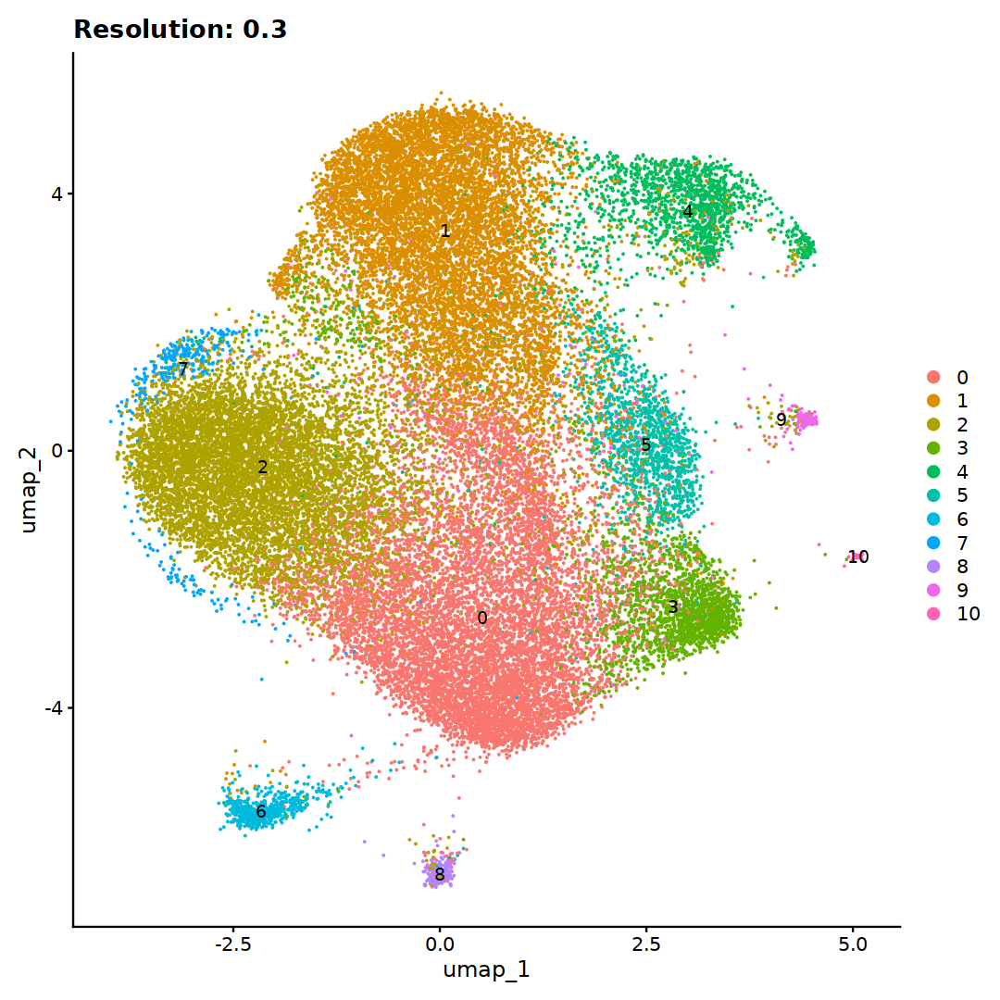

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 34855
Number of edges: 664730

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8144
Number of communities: 156
Elapsed time: 6 seconds


139 singletons identified. 17 final clusters.



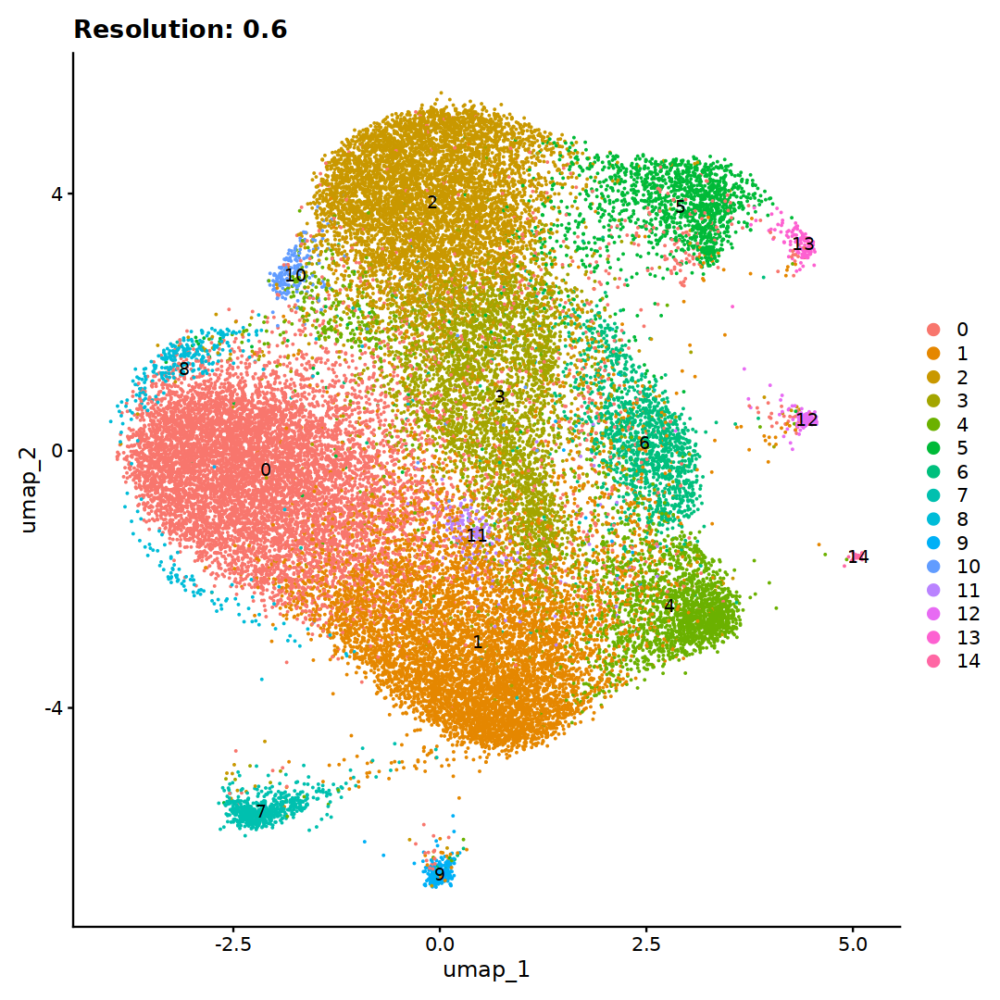

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 34855
Number of edges: 664730

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.7934
Number of communities: 158
Elapsed time: 6 seconds


139 singletons identified. 19 final clusters.



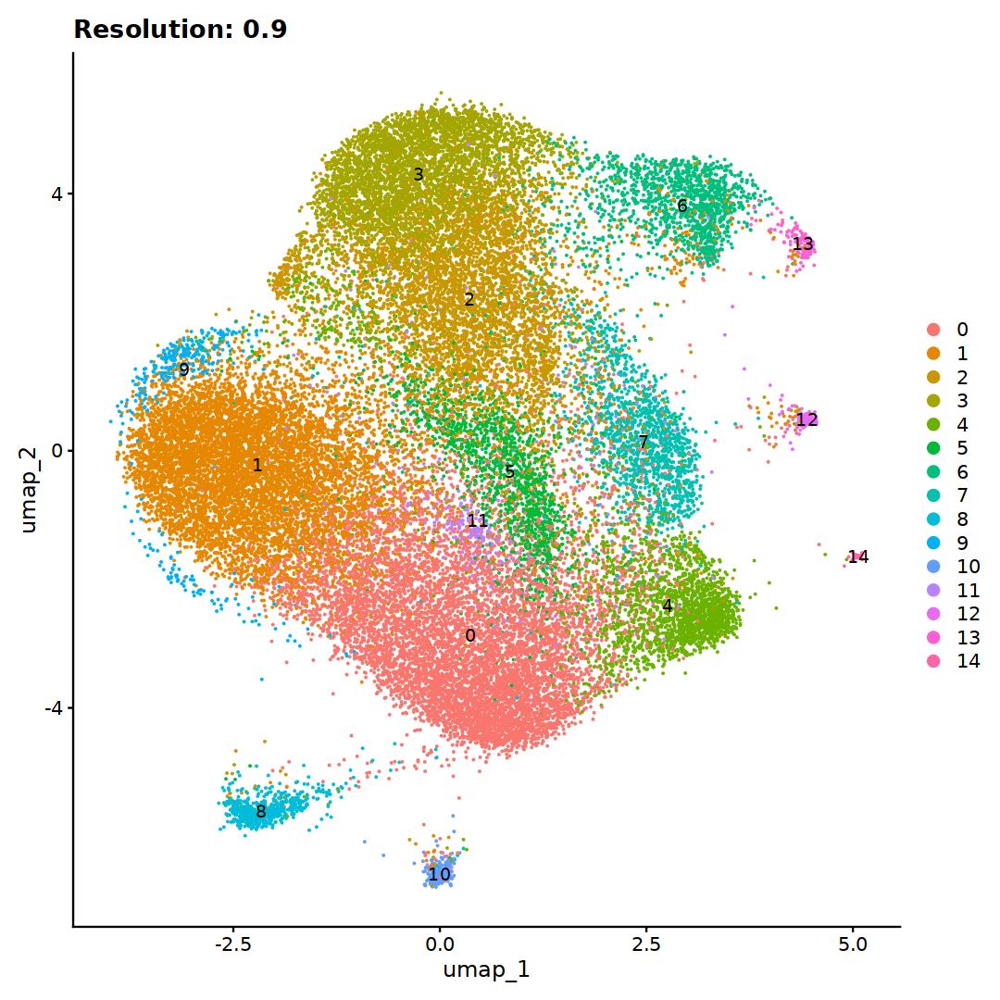

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 34855
Number of edges: 664730

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.7662
Number of communities: 160
Elapsed time: 7 seconds


139 singletons identified. 21 final clusters.



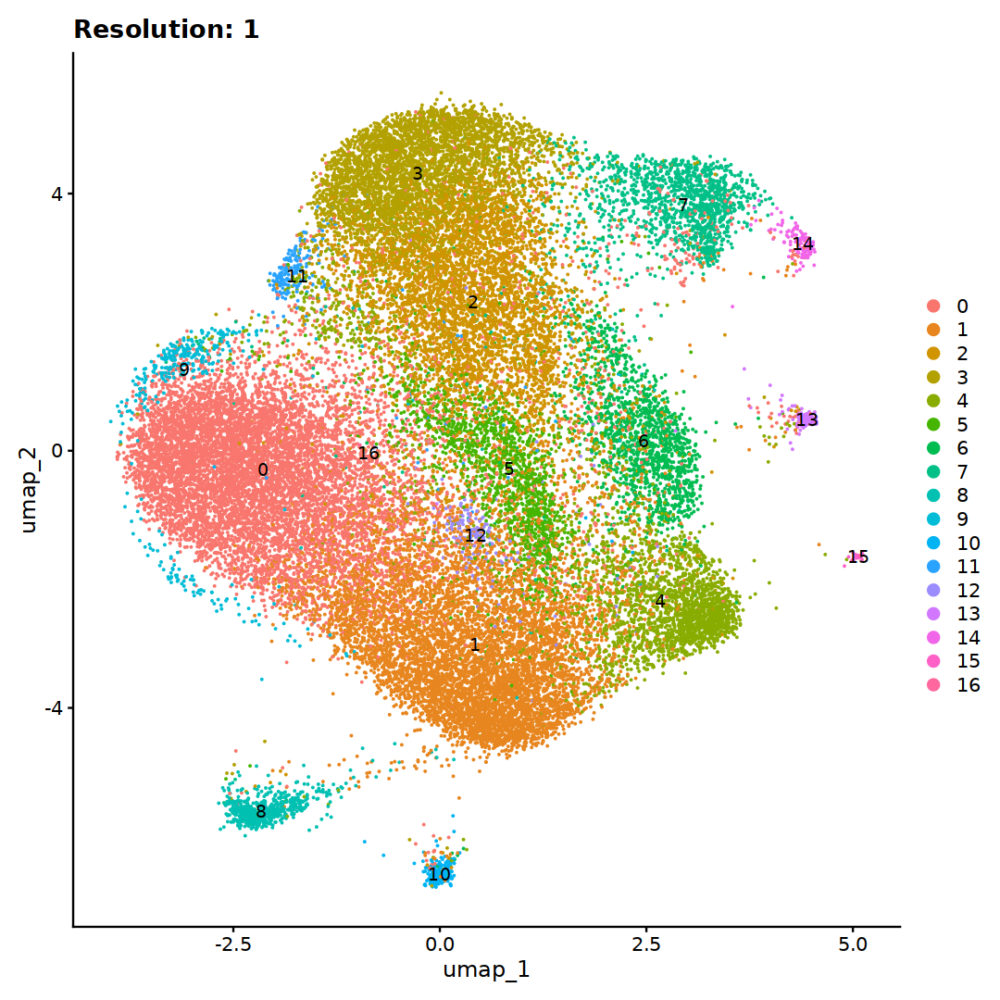

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 34855
Number of edges: 664730

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.7433
Number of communities: 161
Elapsed time: 6 seconds


139 singletons identified. 22 final clusters.



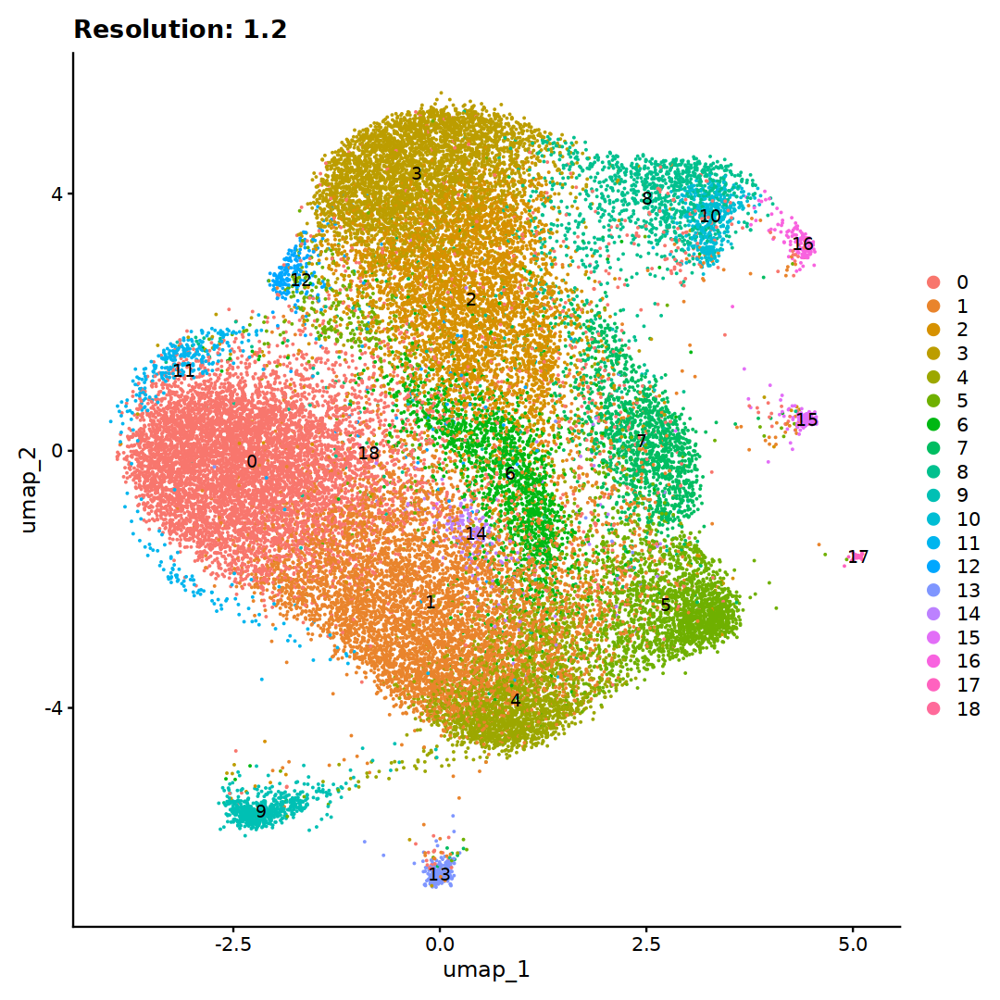

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 34855
Number of edges: 664730

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.7279
Number of communities: 163
Elapsed time: 6 seconds


139 singletons identified. 24 final clusters.



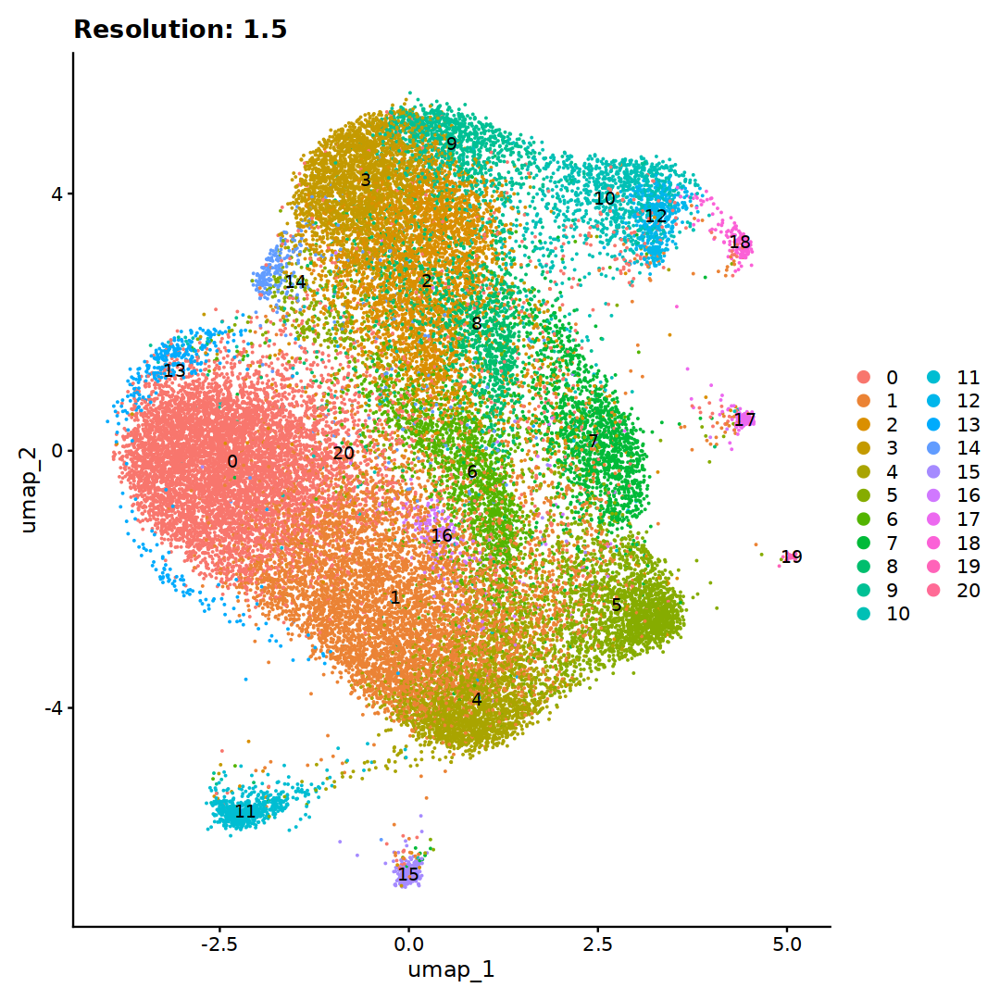

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 34855
Number of edges: 664730

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.6942
Number of communities: 167
Elapsed time: 7 seconds


139 singletons identified. 28 final clusters.



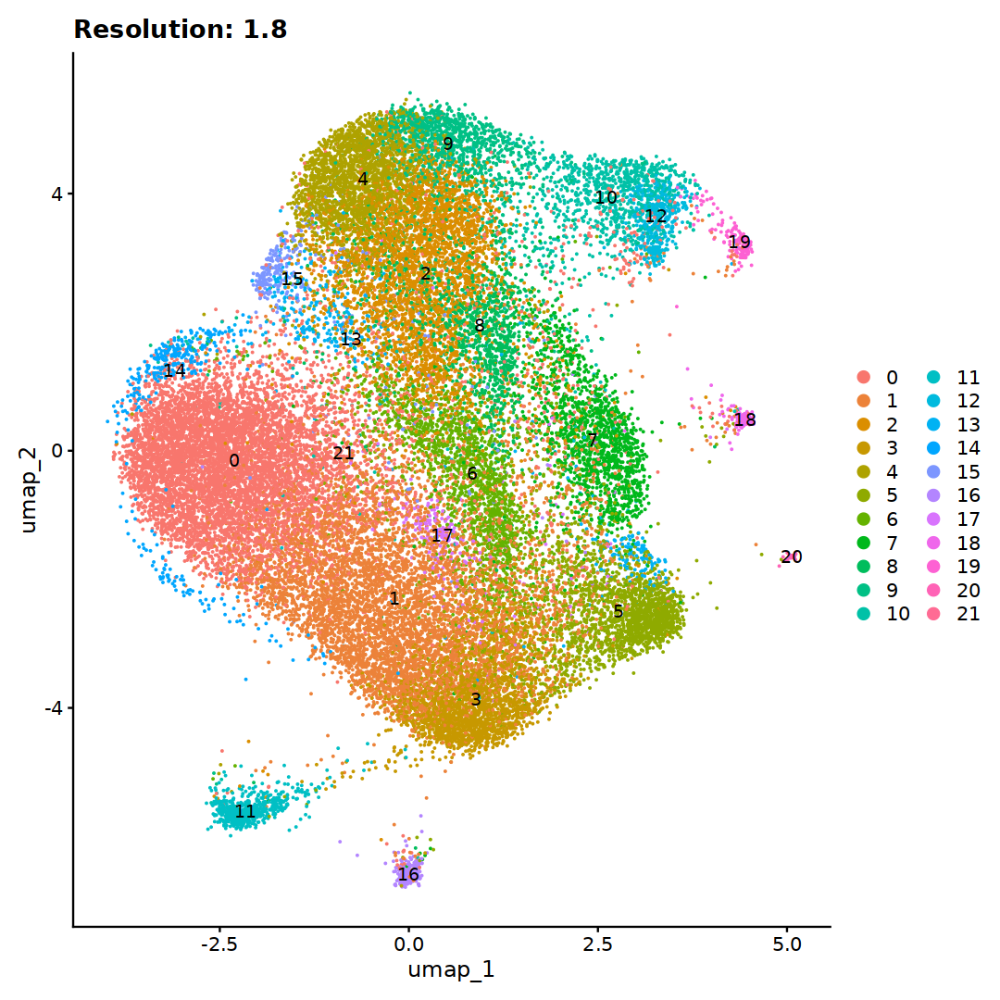

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 34855
Number of edges: 664730

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.6681
Number of communities: 173
Elapsed time: 8 seconds


139 singletons identified. 34 final clusters.



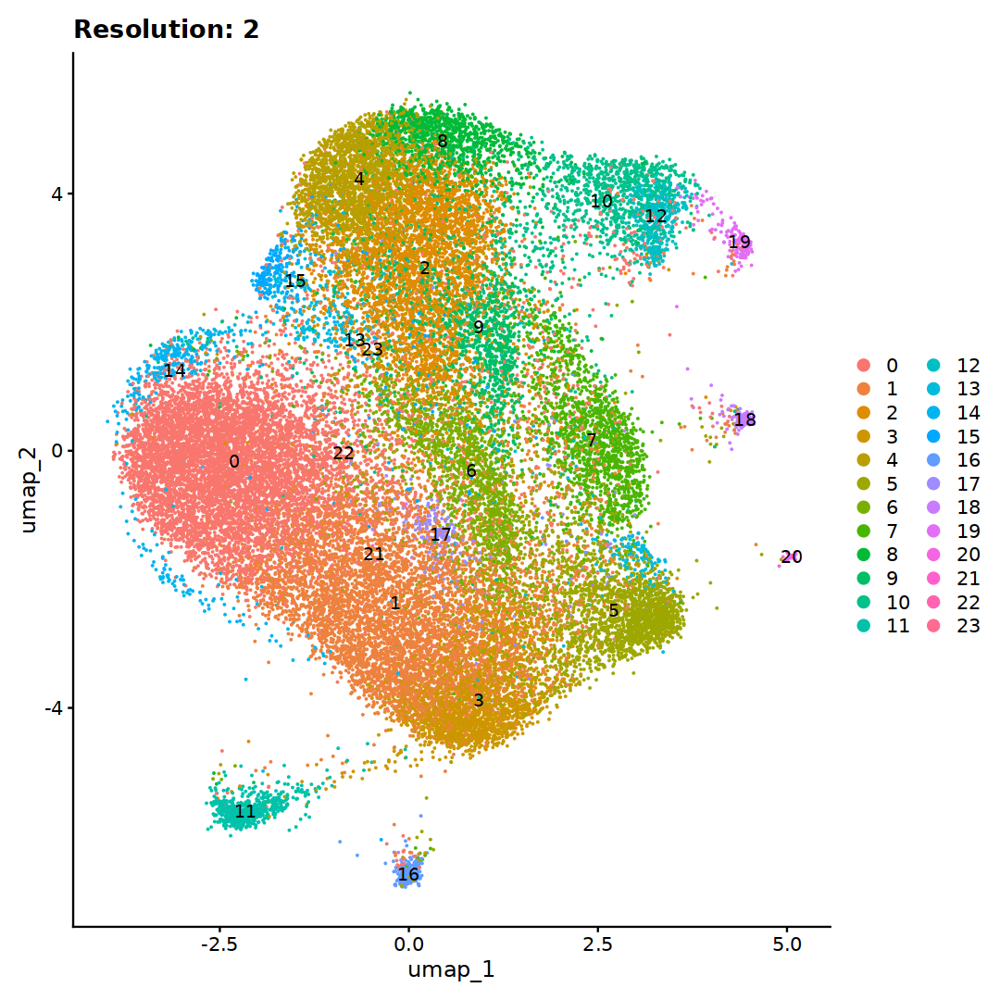

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 34855
Number of edges: 664730

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.6450
Number of communities: 177
Elapsed time: 7 seconds


139 singletons identified. 38 final clusters.



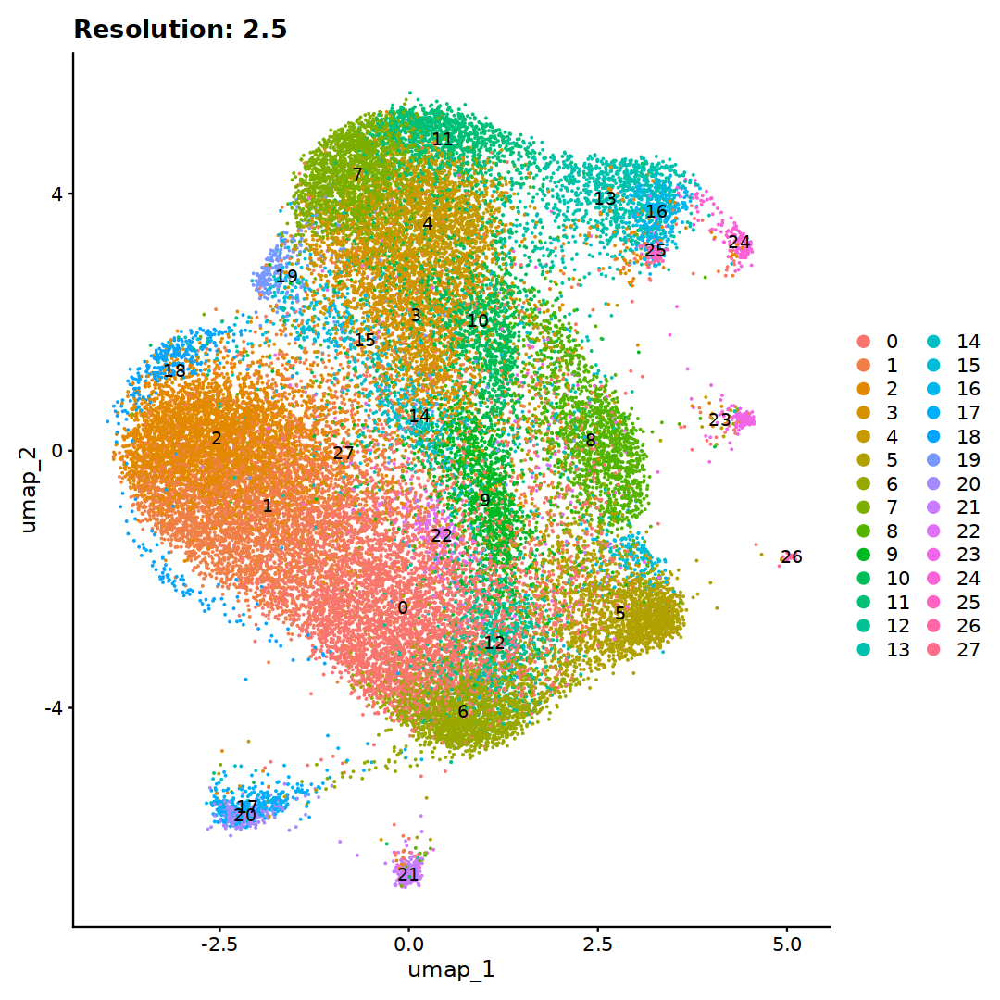

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 34855
Number of edges: 664730

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.6229
Number of communities: 178
Elapsed time: 7 seconds


139 singletons identified. 39 final clusters.



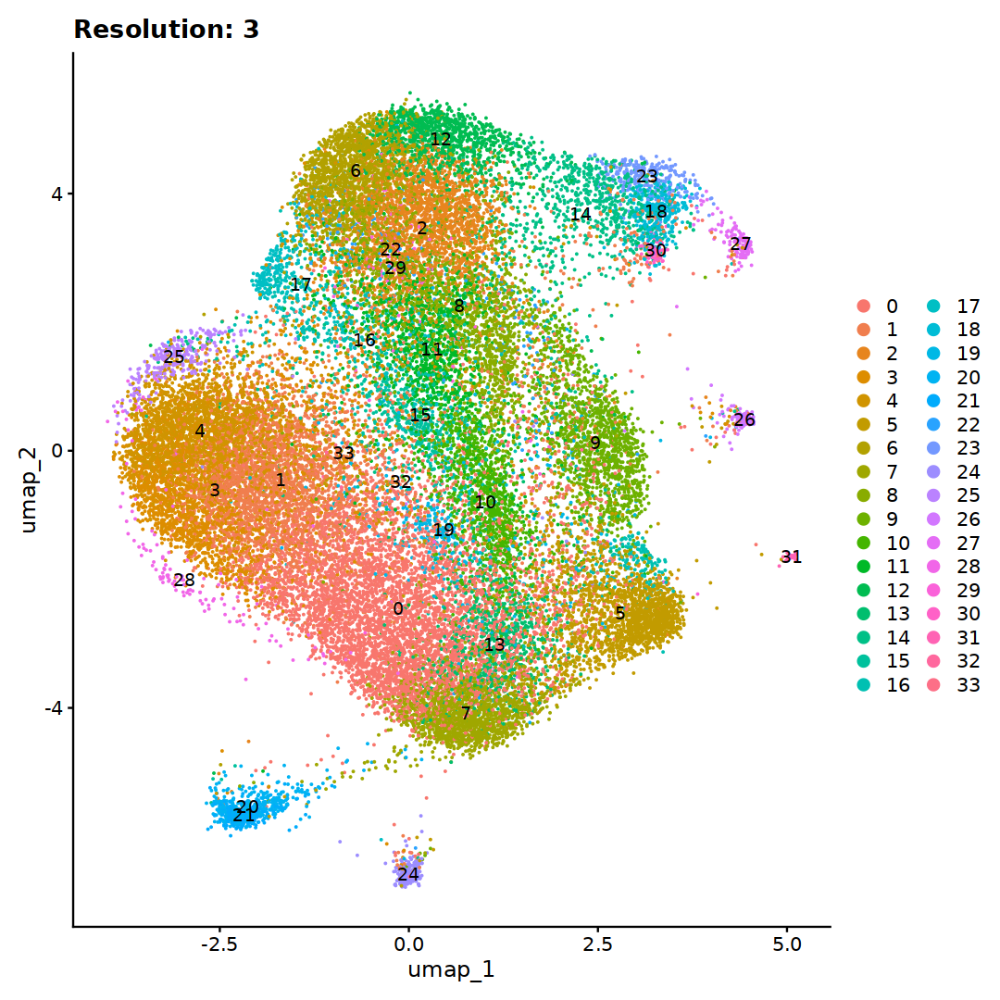

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 34855
Number of edges: 664730

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.6037
Number of communities: 182
Elapsed time: 8 seconds


139 singletons identified. 43 final clusters.



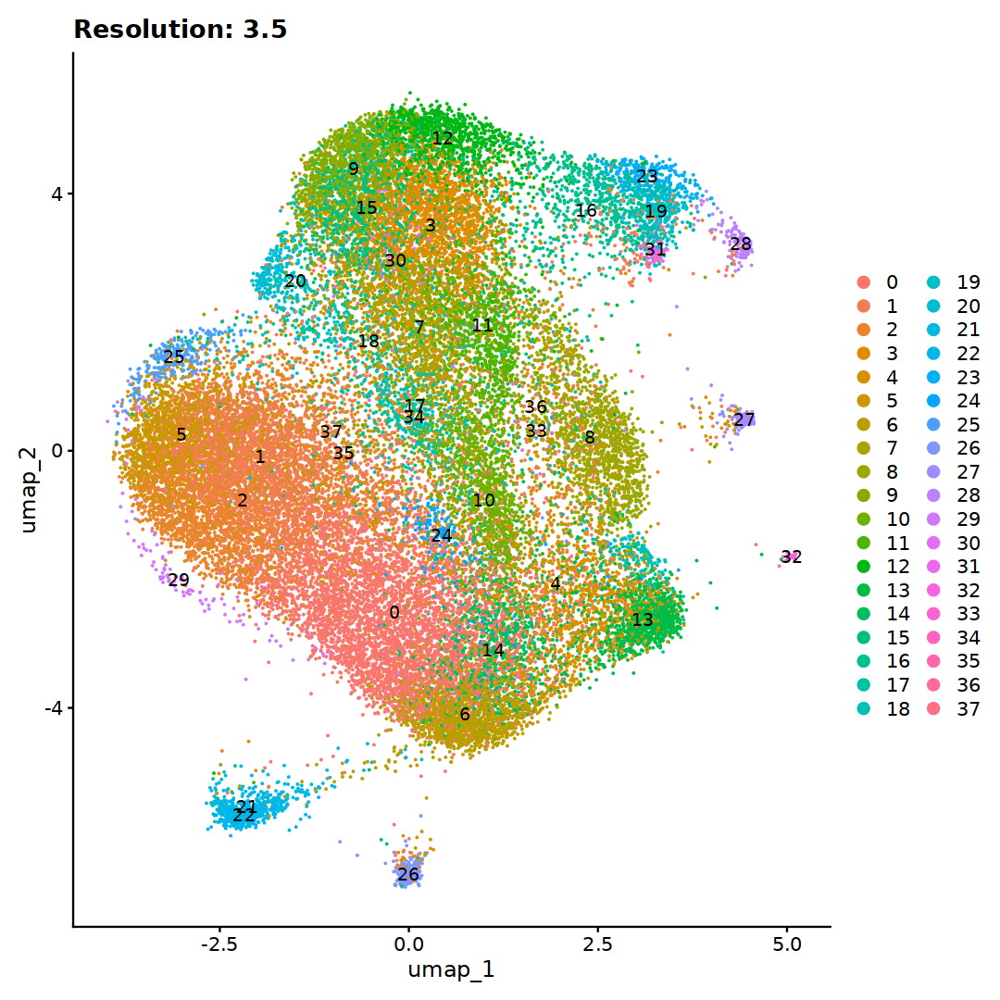

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 34855
Number of edges: 664730

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.5852
Number of communities: 182
Elapsed time: 8 seconds


139 singletons identified. 43 final clusters.



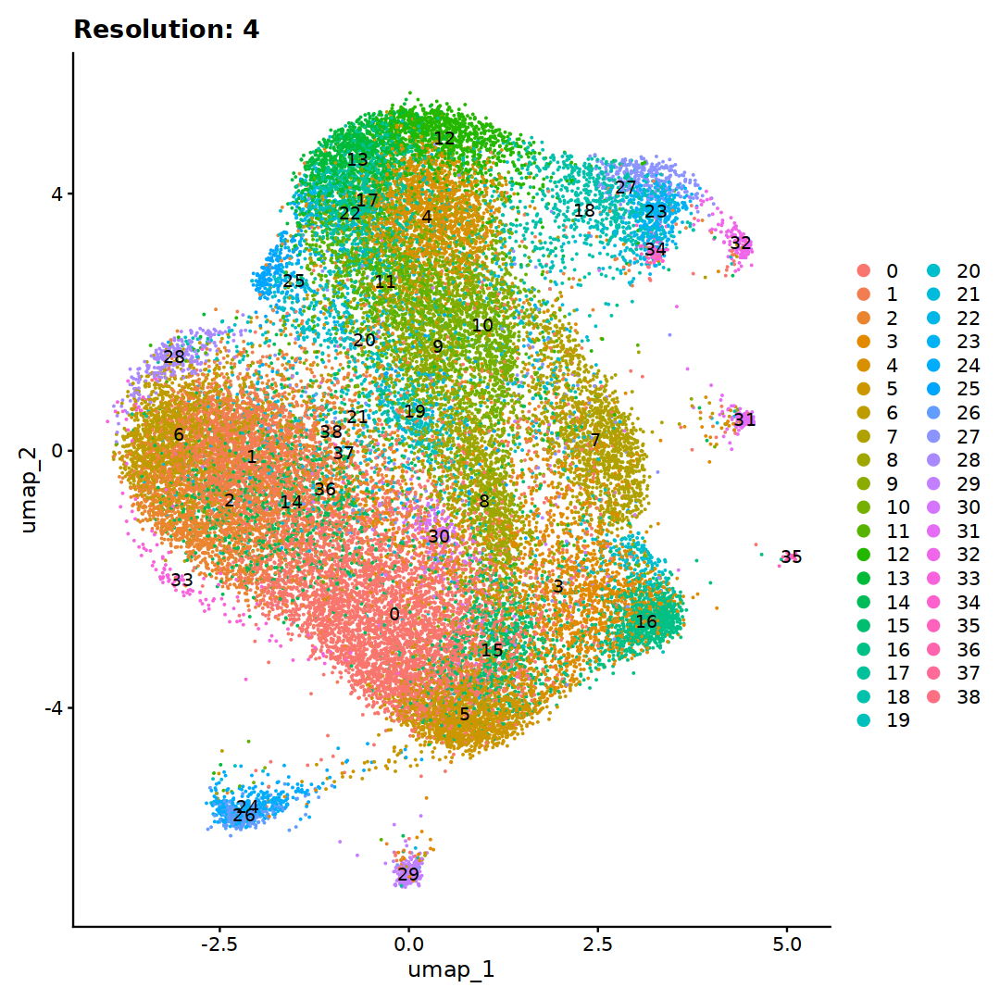

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 34855
Number of edges: 664730

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.5677
Number of communities: 188
Elapsed time: 8 seconds


139 singletons identified. 49 final clusters.



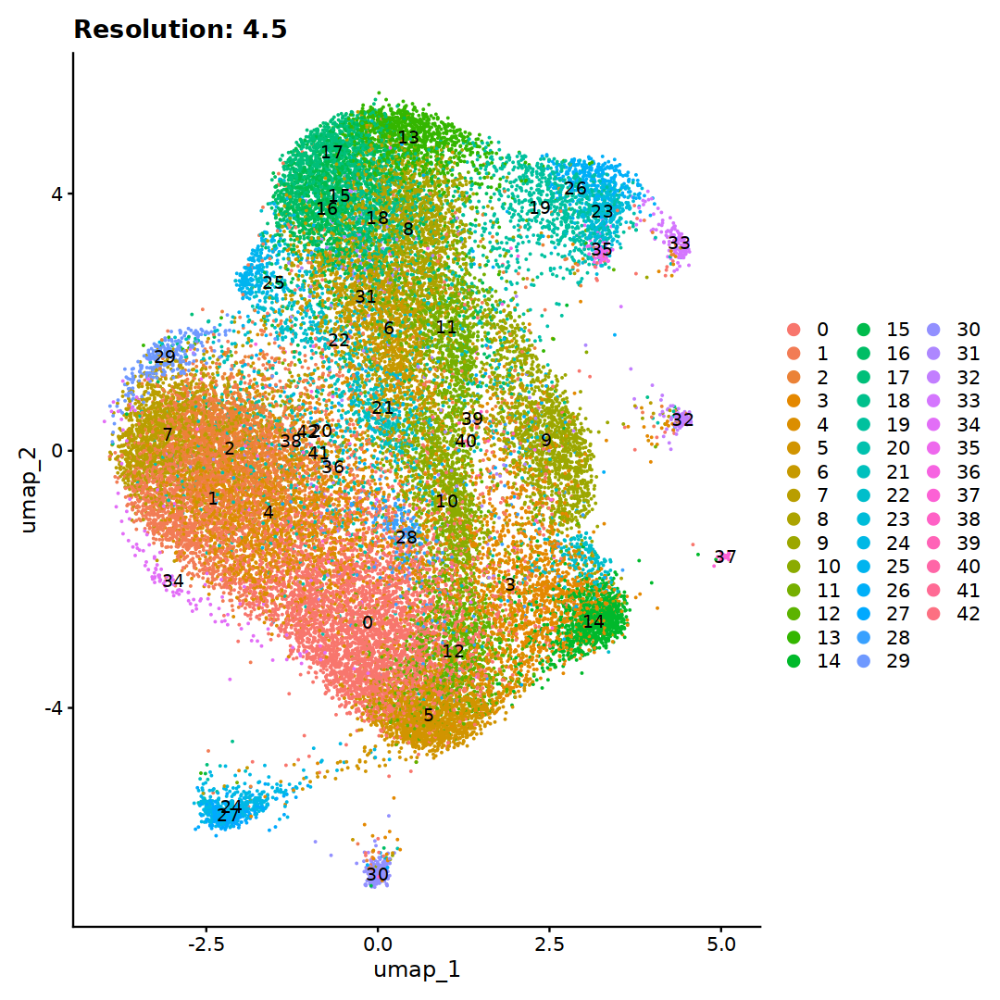

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 34855
Number of edges: 664730

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.5522
Number of communities: 194
Elapsed time: 8 seconds


140 singletons identified. 54 final clusters.



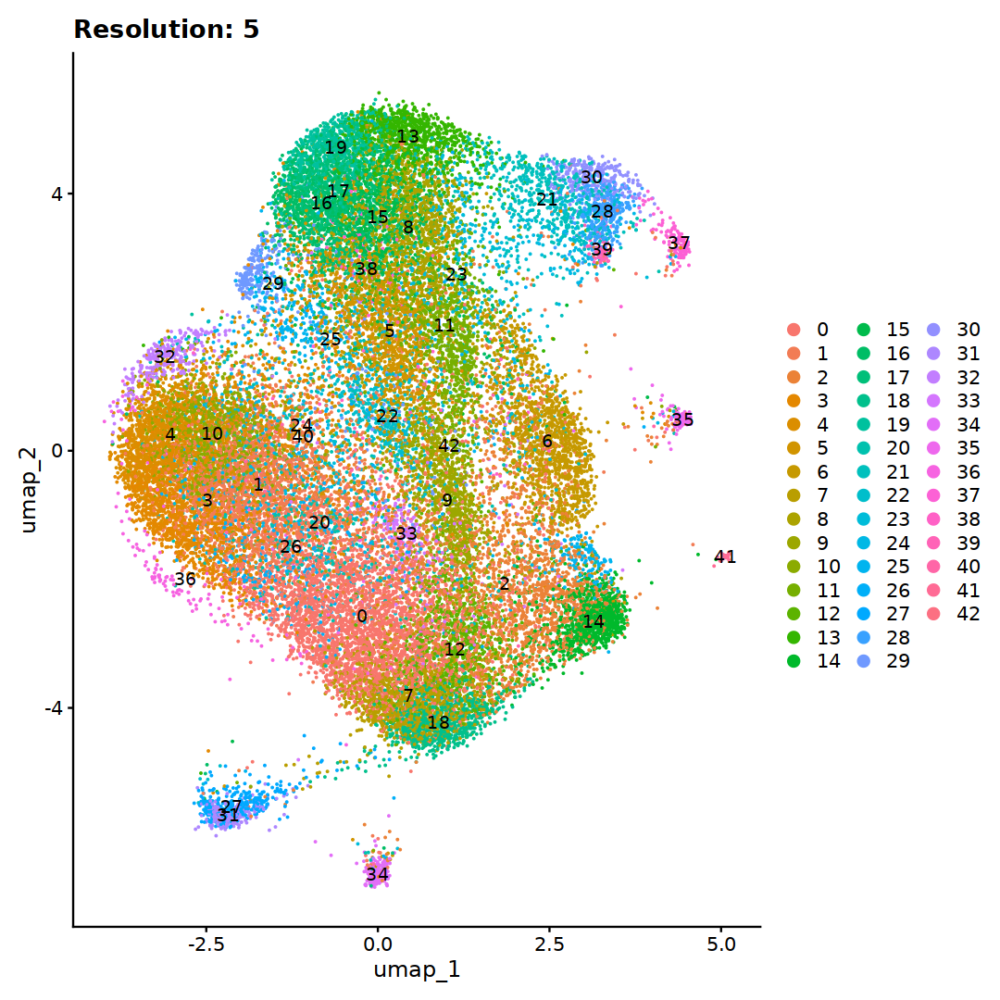

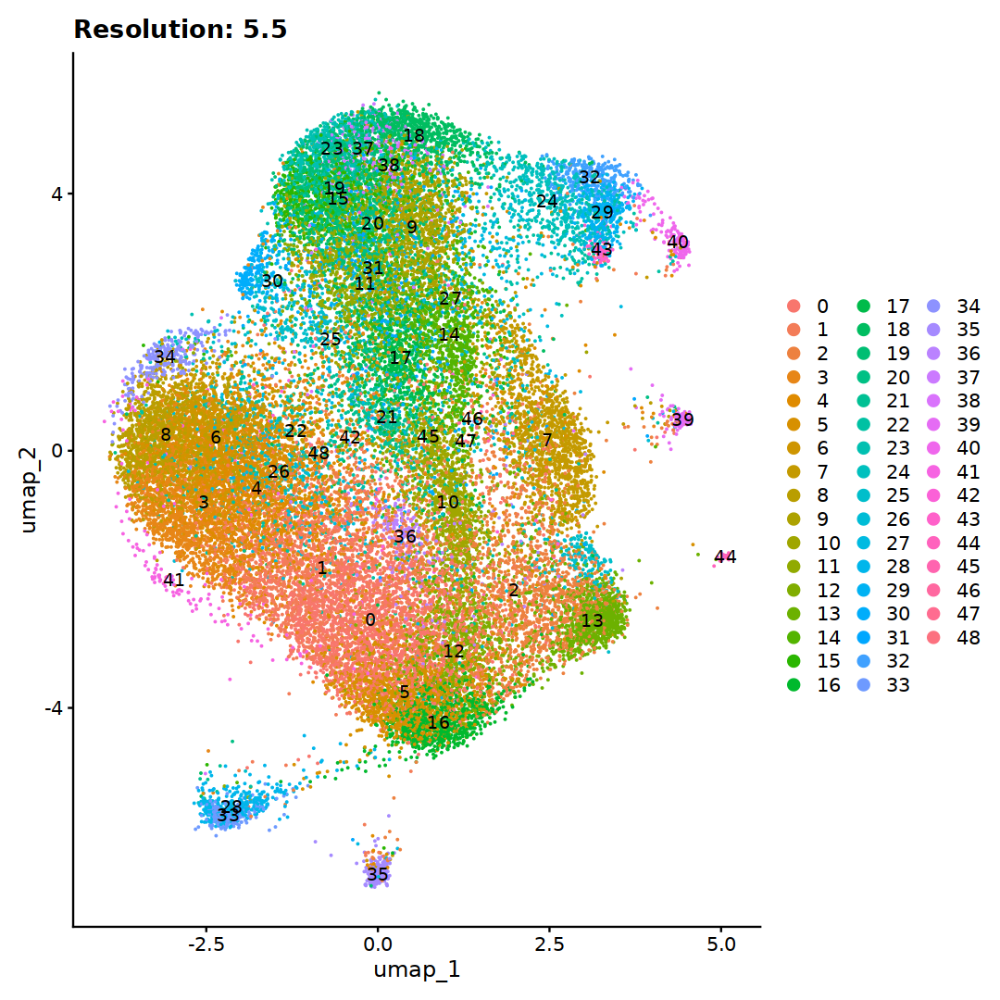

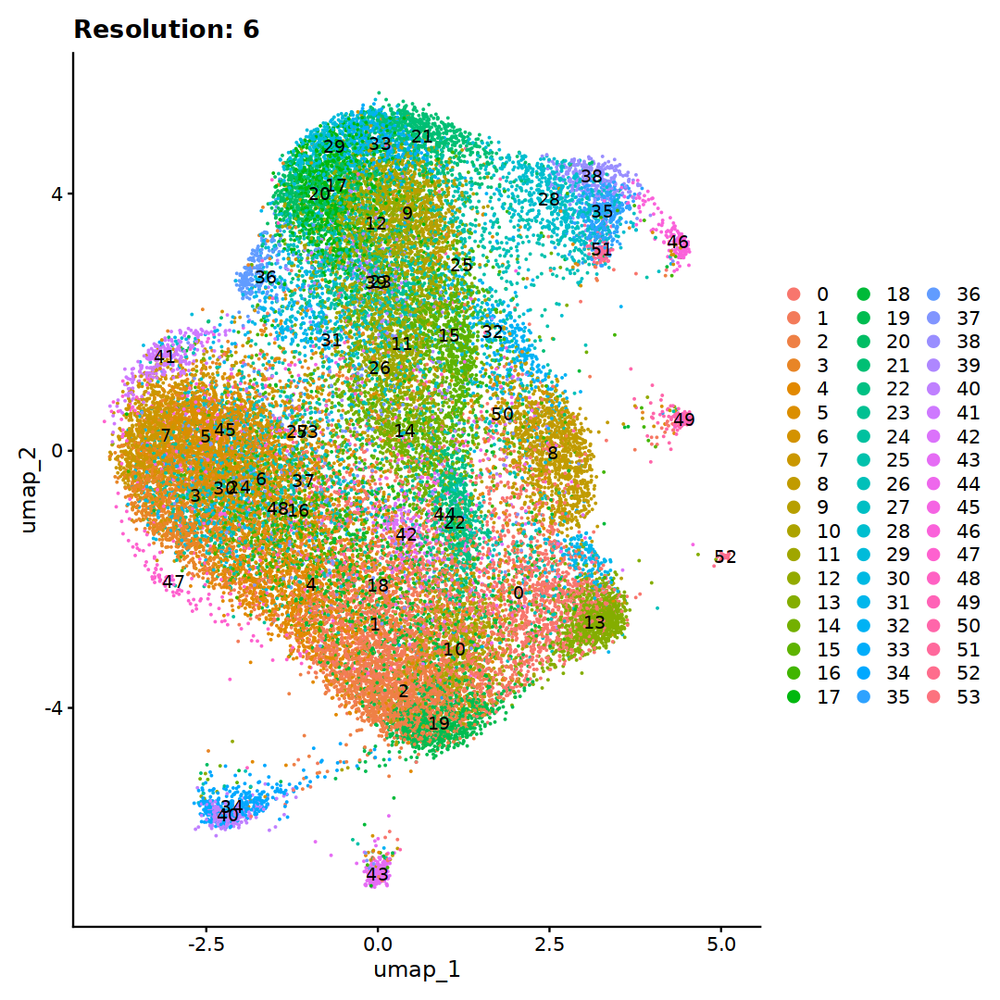

In [14]:
library(Seurat)
library(clustree)
library(dplyr)

# UMAP
Cere_Glu <- RunUMAP(Cere_Glu, dims = 1:40, verbose = TRUE)

cluster_results <- list()

# re-cluster
for (i in c(0.3,0.6,0.9,1,1.2,1.5, 1.8, 2, 2.5, 3, 3.5, 4, 4.5, 5, 5.5, 6)) {
  Cere_Glu <- FindClusters(Cere_Glu, resolution = i)
  
  res_col_name <- paste0("integrated_snn_res.", i)
  new_col_name <- paste0("Glu_", res_col_name)
  colnames(Cere_Glu@meta.data)[colnames(Cere_Glu@meta.data) == res_col_name] <- new_col_name
  
  cluster_results[[paste0("resolution_", i)]] <- Cere_Glu
  
  plot <- DimPlot(Cere_Glu, reduction = "umap", label = TRUE) + 
    labs(title = paste0("Resolution: ", i))
  print(plot)
}

In [15]:
saveRDS(Cere_Glu, file = '/data/work/5months_Cere/Glu/10_budgerigar_brain_5months_Cere_Glu_unannotated.rds')